<a href="https://colab.research.google.com/github/farshadabdulazeez/deep-learning-projects/blob/main/perceptron_trick.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from sklearn.datasets import make_classification
import numpy as np
X, y = make_classification(n_samples=100, n_features=2, n_informative=1,n_redundant=0,
                           n_classes=2, n_clusters_per_class=1, random_state=41,hypercube=False,class_sep=10)

In [2]:
import matplotlib.pyplot as plt

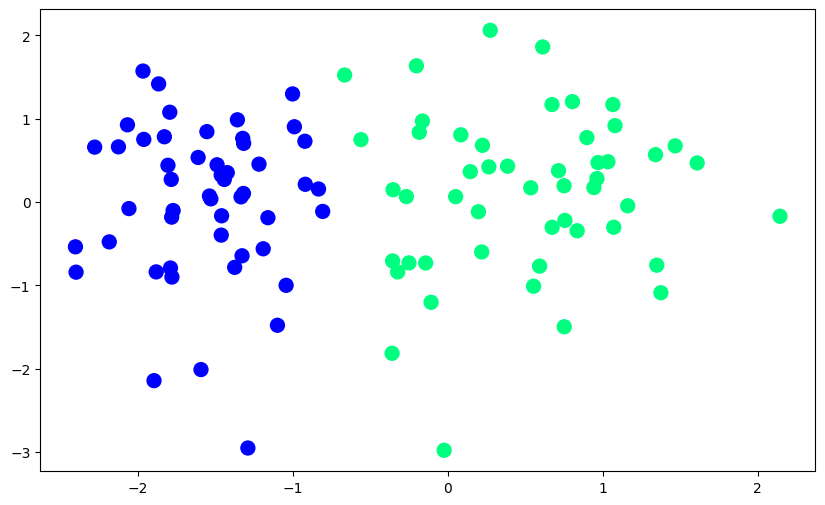

In [3]:
plt.figure(figsize=(10,6))
plt.scatter(X[:,0],X[:,1],c=y,cmap='winter',s=100)

In [4]:
def perceptron(X, y):
    """
    Implements a basic perceptron learning algorithm.

    Parameters:
    X : numpy array
        Feature matrix with each row representing a data point and columns representing features.
    y : numpy array
        Target labels (binary), where values are typically 0 or 1.

    Returns:
    Tuple containing:
    - weights[0]: The bias term learned by the perceptron.
    - weights[1:]: The weight vector learned for the features.
    """

    # Add a bias term as the first column in X. This inserts a column of ones at index 0.
    X = np.insert(X, 0, 1, axis=1)

    # Initialize weights to ones. The size matches the number of features in X (including bias).
    weights = np.ones(X.shape[1])

    # Learning rate that controls the step size for weight updates.
    lr = 0.1

    # Iterate for a fixed number of epochs (here, 1000) for training.
    for i in range(1000):
        # Randomly select an index to pick a data point for stochastic weight update.
        j = np.random.randint(0, 100)

        # Compute the predicted output (y_hat) using the step activation function.
        # The prediction is based on the weighted sum of inputs and bias.
        y_hat = step(np.dot(X[j], weights))

        # Update the weights using the perceptron learning rule:
        # weights = weights + lr * (true_label - predicted_label) * input
        # This ensures that the perceptron minimizes classification errors.
        weights = weights + lr * (y[j] - y_hat) * X[j]

    # Return the bias term (weights[0]) and the feature weights (weights[1:]).
    return weights[0], weights[1:]


In [5]:
def step(z):
    return 1 if z>0 else 0

In [6]:
intercept_,coef_ = perceptron(X,y)

In [7]:
print(coef_)
print(intercept_)

[1.30632065 0.13889305]
1.0


In [8]:
# Calculate the slope (m) of the decision boundary line.
# The slope is derived from the relationship between the coefficients of the features (coef_).
# The formula for the slope is m = -coef_[0] / coef_[1], where:
# - coef_[0] is the weight associated with the first feature (x-axis),
# - coef_[1] is the weight associated with the second feature (y-axis).
m = -(coef_[0] / coef_[1])

# Calculate the y-intercept (b) of the decision boundary line.
# The intercept is derived from the bias term (intercept_) and the weight of the second feature (coef_[1]).
# The formula for the intercept is b = -intercept_ / coef_[1], ensuring proper alignment of the decision boundary.
b = -(intercept_ / coef_[1])


In [9]:
x_input = np.linspace(-3,3,100)
y_input = m*x_input + b

(-3.0, 2.0)

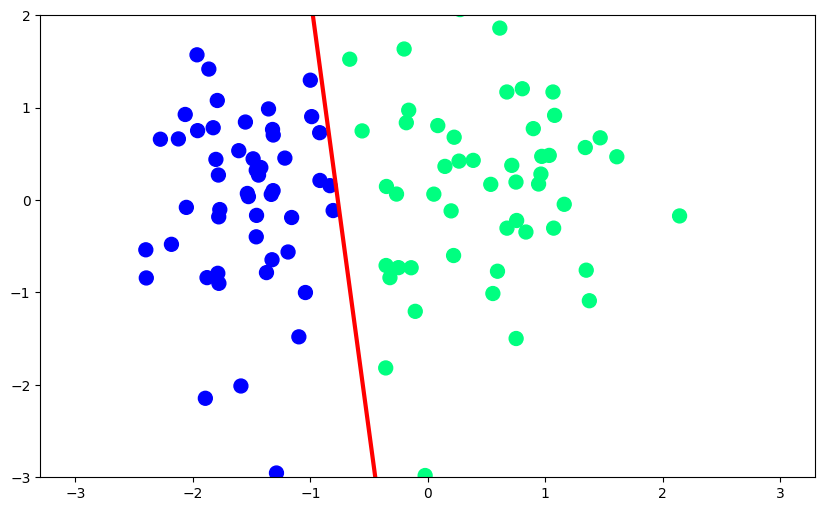

In [10]:
plt.figure(figsize=(10,6))
plt.plot(x_input,y_input,color='red',linewidth=3)
plt.scatter(X[:,0],X[:,1],c=y,cmap='winter',s=100)
plt.ylim(-3,2)

In [19]:
from sklearn.datasets import make_classification
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Create synthetic data
X, y = make_classification(n_samples=100, n_features=2, n_informative=1, n_redundant=0,
                           n_classes=2, n_clusters_per_class=1, random_state=41, hypercube=False, class_sep=10)

# Step function for predictions
def step(z):
    return 1 if z >= 0 else 0

# Perceptron function
def perceptron(X, y):
    m = []
    b = []
    X = np.insert(X, 0, 1, axis=1)  # Add bias term
    weights = np.ones(X.shape[1])  # Initialize weights
    lr = 0.1  # Learning rate

    for i in range(200):  # Train for 200 epochs
        j = np.random.randint(0, 100)  # Randomly pick a sample
        y_hat = step(np.dot(X[j], weights))  # Predicted label
        weights = weights + lr * (y[j] - y_hat) * X[j]  # Update weights

        # Calculate slope and intercept for the decision boundary
        m.append(-weights[1] / weights[2])
        b.append(-weights[0] / weights[2])

    return m, b

# Train the perceptron and get the decision boundary parameters
m, b = perceptron(X, y)

# Plotting and animation setup
fig, ax = plt.subplots(figsize=(9, 5))
x_i = np.arange(-3, 3, 0.1)
ax.scatter(X[:, 0], X[:, 1], c=y, cmap='winter', s=100)  # Scatter plot of data points
line, = ax.plot(x_i, m[0] * x_i + b[0], color='red', linewidth=2)  # Initial decision boundary
plt.ylim(-3, 3)

# Update function for animation
def update(i):
    label = f'Epoch {i+1}'  # Update epoch label
    line.set_ydata(m[i] * x_i + b[i])  # Update decision boundary
    ax.set_xlabel(label)  # Update axis label
    return line, ax

# Create the animation
anim = FuncAnimation(fig, update, frames=range(200), interval=100, blit=True)

# Display the animation in Colab
HTML(anim.to_jshtml())  # Convert animation to HTML for rendering in Colab


<IPython.core.display.Javascript object>